## Plot creation code for GDELT Analysis

### Setup

In [ ]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx
import itertools as it
import torch as pt
import tqdm
import pyproj as pp
import shapely.geometry as geom
from matplotlib import colormaps as cmaps
import windrose as rose

import sqlite3
import datetime as dt

from GDELTAnomalies.datasets import gdelt_pt_dataset

In [57]:
wgs84 = pp.CRS.from_epsg(4326)
web = pp.CRS.from_epsg(3857)

In [58]:
data = pd.read_csv("sampledata.csv")

/tmp/ipykernel_1938861/2674561073.py:1: DtypeWarning: Columns (9,12,19,22,56) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("sampledata.csv")


In [59]:
data

,Unnamed: 0,ID,Day,Actor1Code,Actor1Name,Actor1CountryCode,Actor1KnownGroupCode,Actor1EthnicCode,Actor1Religion1Code,Actor1Religion2Code,...,ActionGeo_ADM2Code,ActionGeo_Lat,ActionGeo_Long,ActionGeo_FeatureID,DATEADDED,SOURCEURL,year,month,latAvg,lonAvg
0,0,507829734,2016-02-02T11:15:00.000,DEU,GERMANY,DEU,NaN,NaN,NaN,NaN,...,NaN,25.0,17.0,LY,20160202111500,http://www.nationmultimedia.com/breakingnews/A...,2016,2,28,15
1,1,507829736,2016-02-02T11:15:00.000,DEU,GERMANY,DEU,NaN,NaN,NaN,NaN,...,NaN,25.0,17.0,LY,20160202111500,http://www.nationmultimedia.com/breakingnews/A...,2016,2,28,15
2,2,507829739,2016-02-02T11:15:00.000,DEU,GERMANY,DEU,NaN,NaN,NaN,NaN,...,NaN,25.0,17.0,LY,20160202111500,http://www.nationmultimedia.com/breakingnews/A...,2016,2,28,15
3,3,507829734,2016-02-02T11:15:00.000,DEU,GERMANY,DEU,NaN,NaN,NaN,NaN,...,NaN,25.0,17.0,LY,20160202111500,http://www.nationmultimedia.com/breakingnews/A...,2016,2,28,15
4,4,507829736,2016-02-02T11:15:00.000,DEU,GERMANY,DEU,NaN,NaN,NaN,NaN,...,NaN,25.0,17.0,LY,20160202111500,http://www.nationmultimedia.com/breakingnews/A...,2016,2,28,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
243863,243863,516521126,2016-02-29T14:30:00.000,USAELI,BILL CLINTON,USA,NaN,NaN,NaN,NaN,...,NaN,40.0,60.0,TX,20160229143000,http://news-sentinel.com/news/us-and-world/Nor...,2016,2,42,65
243864,243864,516584544,2016-02-29T18:30:00.000,USA,AMERICAN,USA,NaN,NaN,NaN,NaN,...,NaN,40.0,60.0,TX,20160229183000,http://www.theledger.com/article/20160229/NEWS...,2016,2,42,65
243865,243865,516584670,2016-02-29T18:30:00.000,USAMED,UNITED STATES,USA,NaN,NaN,NaN,NaN,...,NaN,40.0,60.0,TX,20160229183000,http://www.theledger.com/article/20160229/NEWS...,2016,2,42,65
243866,243866,516584544,2016-02-29T18:30:00.000,USA,AMERICAN,USA,NaN,NaN,NaN,NaN,...,NaN,40.0,60.0,TX,20160229183000,http://www.theledger.com/article/20160229/NEWS...,2016,2,42,65


### Raw Dataset plots

For the raw dataset, we can plot each point's ActionGeo and color by actor. This example also puts the spatial grid down.

In [60]:
geometry = gpd.points_from_xy(data["ActionGeo_Long"], data["ActionGeo_Lat"], crs=wgs84)

In [61]:
geodata = gpd.GeoDataFrame(data, geometry=geometry, crs=wgs84)
geodata2 = geodata.to_crs(web)

In [62]:
latmin = 19
latmax = 62.5
lonmin = 10
lonmax = 60

vert_lines = [10 + 10 * x for x in range(6)][1:-1]
h_lines = [19.5 + 5 * x for x in range(9)][1:]

lines_list = [geom.LineString([(lonmin, x), (lonmax, x)]) for x in h_lines] + [geom.LineString([(x, latmin), (x, latmax)]) for x in vert_lines]
grid = gpd.GeoDataFrame(geometry=lines_list, crs=wgs84)
grid2 = grid.to_crs(web)

Text(0.5, 1.0, 'GDELT Data by Actor, February 2016')

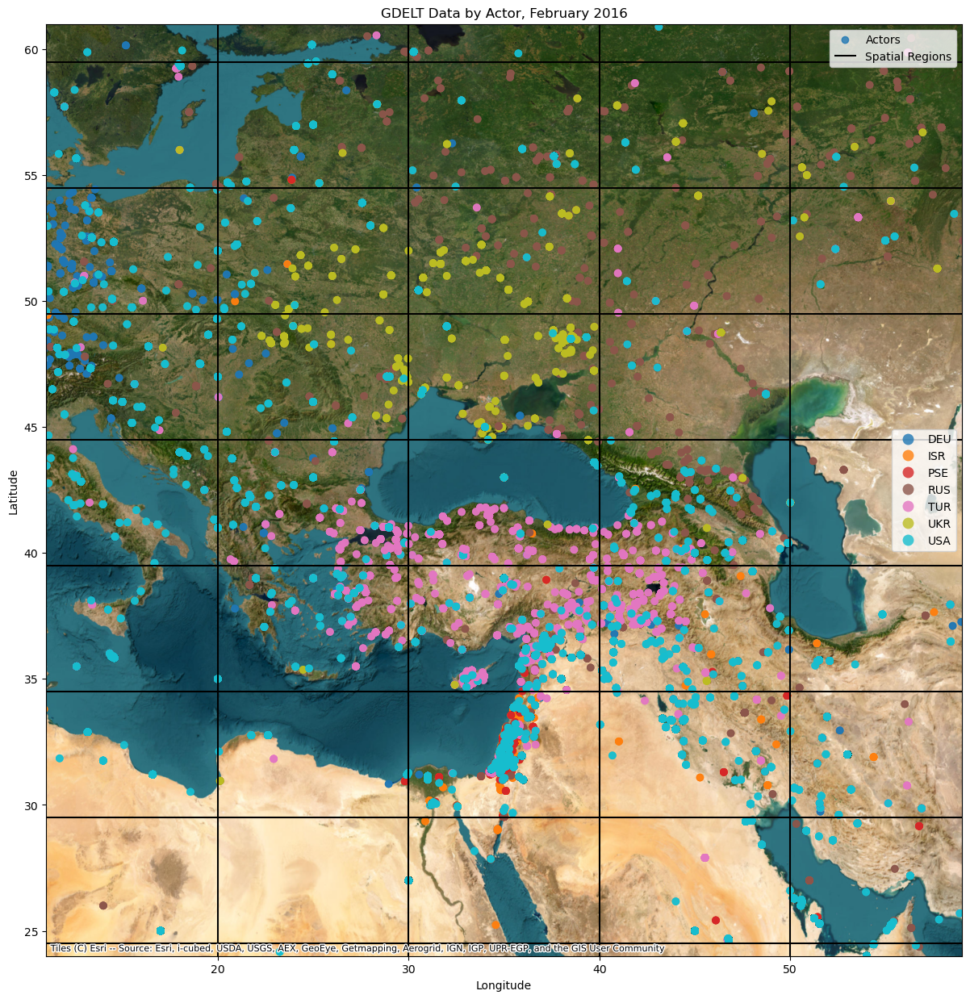

In [63]:
fig, ax = plt.subplots(figsize=(15,15))
hmm = geodata.plot(ax=ax, column="Actor1CountryCode", label="Actors", legend=True, alpha=0.8, cmap="tab10")
grid.plot(ax=ax, color="black", label="Spatial Regions")

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.ylim(24, 61)
plt.xlim(11, 59)

cx.add_basemap(ax, source=cx.providers.Esri.WorldImagery, crs=wgs84, zoom=6)
ax.add_artist(hmm.get_legend())
ax.legend(loc="upper right")
plt.title("GDELT Data by Actor, February 2016")

### Plotting Predictions and Aggregated Dataset

After aggregation, we have 105 time series per spatial location, if plotting only one of these we can use a heatmap or points at the centroids of each of the grid cells. 

In [64]:
dataset = gdelt_pt_dataset.GDELTDataset(csv_location="gdelt_fix.csv", lookback=10, horizon=1, step=1, flatten=False, dtype=pt.float32, return_index=True)

In [73]:
def get_plottable(predictions: np.ndarray, colnames: list) -> tuple:
    """Puts predictions into nice geopandas dataframes for easy plotting"""
    if predictions.shape[0] == dataset.num_series:
        lonMin = dataset.lonAvg - 5
        lonAvg = dataset.lonAvg
        lonMax = dataset.lonAvg + 5
        latAvg = dataset.latAvg
        latAvg[(latAvg % 10) == 8] -= 1
        latMin = dataset.latAvg - 2.5
        latMax = dataset.latAvg + 2.5
        
        lat_uniq = np.unique(dataset.latAvg)
        lon_uniq = np.unique(dataset.lonAvg)

        countries = dataset.countries
        _, idxs = np.unique(countries, return_index=True)
        countries_uniq = np.array(countries)[np.sort(idxs)]

        events = dataset.events
        _, idxs = np.unique(events, return_index=True)
        events_uniq = np.array(events)[np.sort(idxs)]

        boxdata = {}
        griddata = np.zeros((len(lon_uniq), len(lat_uniq), len(countries_uniq), len(events_uniq), predictions.shape[1]))
        pointgeom = []
        pointEntries = []
        allXpoints = set()
        allYpoints = set()
        xticks = []
        yticks = []
        for i in range(len(lonMin)):
            xmin = lonMin[i].item()
            xmax = lonMax[i].item()
            ymin = latMin[i].item()
            ymax = latMax[i].item()
            xmid = lonAvg[i].item()
            ymid = latAvg[i].item()
            
            # Put observation in grid for gradient purposes
            xcoord = np.argwhere(lon_uniq == xmid).item()
            ycoord = np.argwhere(lat_uniq == ymid).item()
            countrycoord = np.argwhere(countries_uniq == countries[i]).item()
            eventcoord = np.argwhere(events_uniq == events[i]).item() 
            
            griddata[xcoord, ycoord, countrycoord, eventcoord] = predictions[i]
            
            # Create box style data
            box = geom.box(xmin, ymin, xmax, ymax)
            if box in boxdata:
                boxdata[box].append((countries[i], events[i], predictions[i]))
            else:
                boxdata[box] = [(countries[i], events[i], predictions[i])]

            # Create multipoint style data
            ypoints = np.linspace(ymin + 0.75, ymax - 0.75, len(countries_uniq))
            xpoints = np.linspace(xmin + 1.5, xmax - 1.5, len(events_uniq))
            
            if np.sum(ypoints) not in allYpoints:
                allYpoints.add(np.sum(ypoints))
                yticks.append(ypoints)
            if np.sum(xpoints) not in allXpoints:
                allXpoints.add(np.sum(xpoints))
                xticks.append(xpoints)

            pointgeom.append(geom.Point(xpoints[eventcoord], ypoints[countrycoord]))
            pointEntries.append(predictions[i].tolist() + [countries[i], events[i]])

        boxResult = []
        boxGeom = []
        for label in boxdata:
            stuff = boxdata[label]
            boxGeom.append(label)
            
            boxCountries, boxEvents, boxData = zip(*stuff)
            resultname = [x + "_" + y for x, y in zip(boxCountries, boxEvents)]
            resultname = [x + "_" + y for x, y in it.product(resultname, colnames)]
            result = np.array(boxData).flatten()
            boxResult.append(pd.Series(result, resultname))

        boxData = gpd.GeoDataFrame(boxResult, geometry=boxGeom)
        pointData = gpd.GeoDataFrame(pointEntries, columns=colnames + ["Actor", "Event"], geometry=pointgeom)
        gx, gy = np.gradient(griddata, axis=(0, 1))

        return boxData, pointData, countries_uniq, events_uniq, list(it.chain(*xticks)), list(it.chain(*yticks)), (griddata, gx, gy), lat_uniq, lon_uniq
    else:
        raise ValueError(f"Must give all {dataset.num_series} series")

Make some random data so we can figure out how to make our plots

In [74]:
boxes, points, countries, events, xticks, yticks, (griddata, gx, gy), gridlat, gridlon = get_plottable(np.random.random((4200, 2)), colnames=["col1", "col2"])

In [75]:
yy, xx = np.meshgrid(gridlat, gridlon)

Text(0.5, 1.0, 'Sample Field Visualization for Entire Region, One Series')

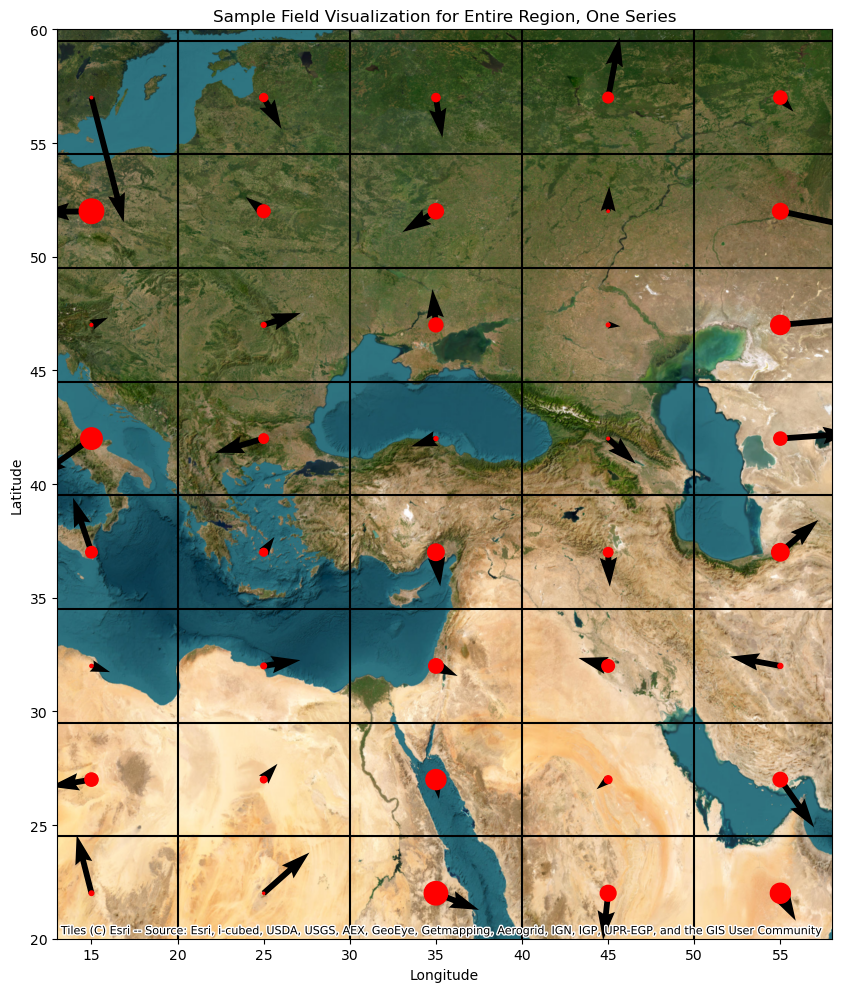

In [76]:
fig, ax = plt.subplots(figsize=(10, 12))
ax.quiver(xx, yy, gx[:, :, 0, 0, 0], gy[:, :, 0, 0, 0], angles="xy")
ax.scatter(xx, yy, s=np.exp(np.sqrt(griddata[:, :, 0, 0, 0]) * 6), color="red")
grid.plot(ax=ax, color="black", label="Spatial Regions")
plt.xlim(13, 58)
plt.ylim(20, 60)
cx.add_basemap(ax, source=cx.providers.Esri.WorldImagery, crs=wgs84, zoom=6)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Sample Field Visualization for Entire Region, One Series")

Beginnings of the heatmap plot: 

This needs better color blending than is available in matplotlib, for now I show blending with terrain or topographic imagery.

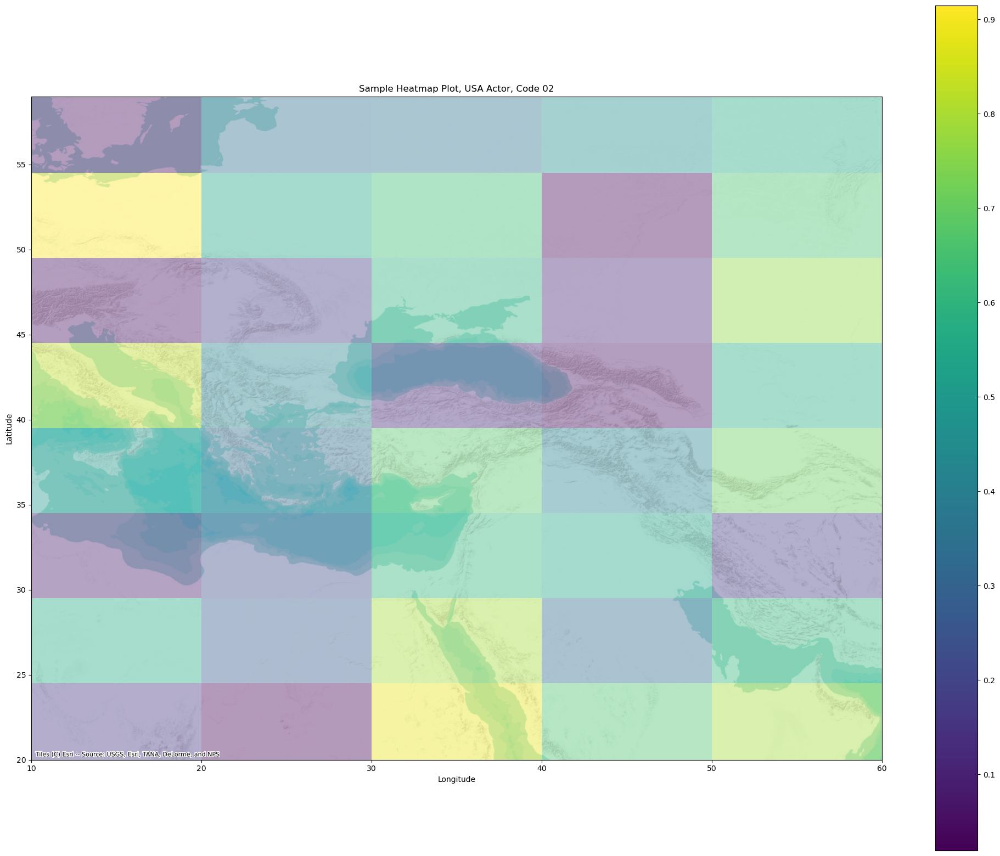

In [77]:
fig, ax = plt.subplots(figsize=(25, 20))
boxes.plot(column="USA_02_col1", ax=ax, alpha=0.4, legend=True)
# grid.plot(ax=ax, color="black")
plt.title("Sample Heatmap Plot, USA Actor, Code 02")
plt.ylabel("Latitude")
plt.xlabel("Longitude")
plt.xlim(10,60)
plt.ylim(20, 59)
cx.add_basemap(ax, source=cx.providers.Esri.WorldTerrain, crs=wgs84, zoom=6)

To visualize all series at once, we can use a bunch of points, one for each series, within each spatial location:

Text(0.5, 1.0, 'Sample Predictions Image, All Series at Once')

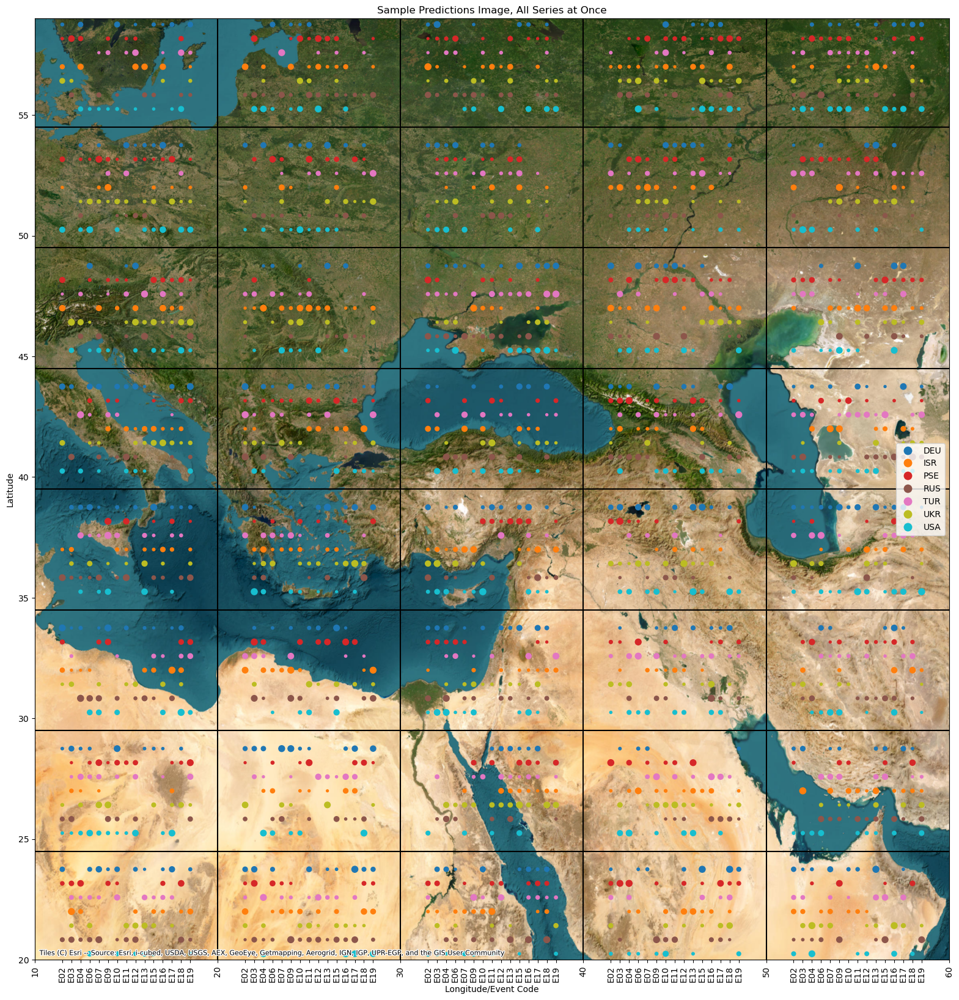

In [78]:
fig, ax = plt.subplots(figsize=(30, 20))
points.plot(column="Actor", markersize=np.exp(points["col1"] * 4) * (points["col1"] > 0.5), ax=ax, legend=True)
currticks = ax.get_xticks()
currticklabels = ax.get_xticklabels()
grid.plot(ax=ax, color="black", label="Spatial Regions")

addticks = xticks
cycler = it.cycle(events)
addticklabels = ["E" + next(cycler) for i in range(len(addticks))]
ax.set_xticks(list(currticks) + addticks)
ax.set_xticklabels(currticklabels + addticklabels, rotation=90)
plt.xlim(10,60)
plt.ylim(20, 59)
plt.xlabel("Longitude/Event Code")
plt.ylabel("Latitude")
cx.add_basemap(ax, source=cx.providers.Esri.WorldImagery, crs=wgs84, zoom=6)
plt.title("Sample Predictions Image, All Series at Once")

Israel - start of gaza war

In [79]:
table = pd.read_csv("GDELTAnomalies/datasets/gdelt_fix.csv", index_col=0)

In [80]:
series = (table == 0).all()
idx = series.index

In [82]:
# Get israel data around start of gaza war
isr_plot_data = table.iloc[449] + table.iloc[450]
boxes, points, countries, events, xticks, yticks, (griddata, gx, gy), gridlat, gridlon = get_plottable(isr_plot_data.to_numpy()[:, None], ["GDELT"])

In [94]:
yy, xx = np.meshgrid(gridlat, gridlon)

Text(0.5, 1.0, 'All Series at Once, 1 before and 1 week after start of Gaza War')

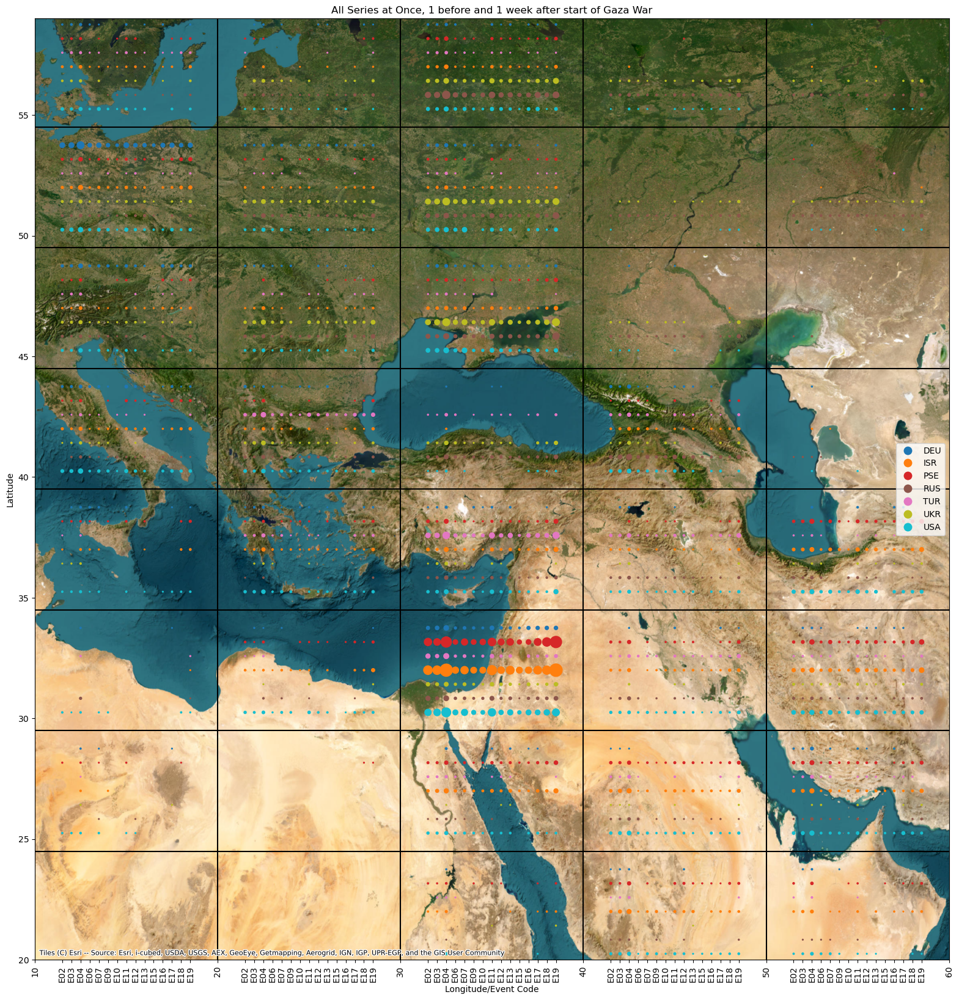

In [88]:
fig, ax = plt.subplots(figsize=(30, 20))
points.plot(column="Actor", markersize=np.sqrt(points["GDELT"] * 1.5) * (points["GDELT"] > 0), ax=ax, legend=True)
currticks = ax.get_xticks()
currticklabels = ax.get_xticklabels()
grid.plot(ax=ax, color="black", label="Spatial Regions")

addticks = xticks
cycler = it.cycle(events)
addticklabels = ["E" + next(cycler) for i in range(len(addticks))]
ax.set_xticks(list(currticks) + addticks)
ax.set_xticklabels(currticklabels + addticklabels, rotation=90)
plt.xlim(10,60)
plt.ylim(20, 59)
plt.xlabel("Longitude/Event Code")
plt.ylabel("Latitude")
cx.add_basemap(ax, source=cx.providers.Esri.WorldImagery, crs=wgs84, zoom=6)
plt.title("All Series at Once, 1 before and 1 week after start of Gaza War")

Rose diagram for israel, same 2 weeks as above:

In [128]:
geod = pp.Geod(ellps="WGS84")

In [102]:
isr_yval = 32
isr_xval = 35

In [200]:
az1, az2, distances = geod.inv(xx.flatten(), yy.flatten(), np.repeat(isr_xval, len(xx.flatten())), np.repeat(isr_yval, len(yy.flatten())))
dist_no_isr = distances.copy()
dist_no_isr[dist_no_isr == 0] = 1e20

Rose diagram using python windrose package, this package does it in kind of a strange way, we may want to change the colors and bins (e.g. the largest bin is often bigger than the maximum, but is still colored in as if something is in it?)

Text(0.5, 1.0, 'USA Appeals around Israel, distance weighted, normalized, Week Before and After Gaza War')

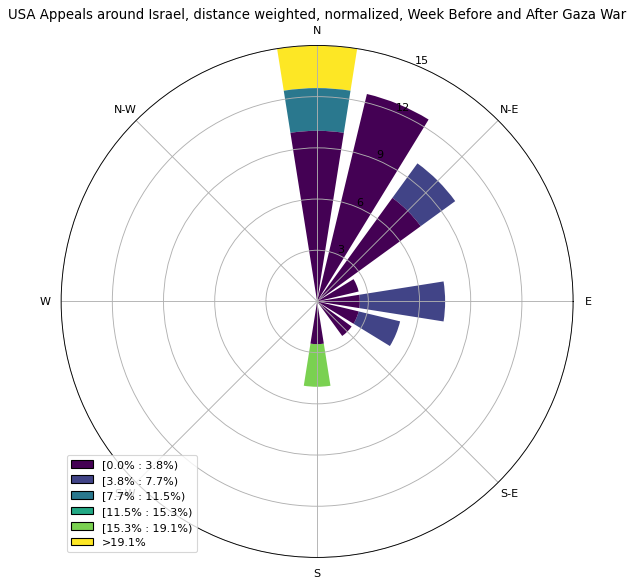

In [347]:
wrax = rose.WindroseAxes.from_ax(figsize=(8, 8))
wrax.bar(az2, np.exp(-dist_no_isr / 5e5) * griddata[:, :, 0, 0, 0].flatten(), normed=True)
legend = wrax.legend()
legend_text = legend.get_texts()
for i, text in enumerate(legend_text):
    text = text.get_text()
    if text.endswith(")"):
        legend_text[i].set_text(text.replace(")", "%)").replace(" :", "% :"))
    else:
        legend_text[i].set_text(text + "%")
wrax.set_title("USA Appeals around Israel, distance weighted, normalized, Week Before and After Gaza War")


For context, this is the data that the above comes from:

Text(0.5, 1.0, 'US Appeals around Israel for context, Distance Weighted')

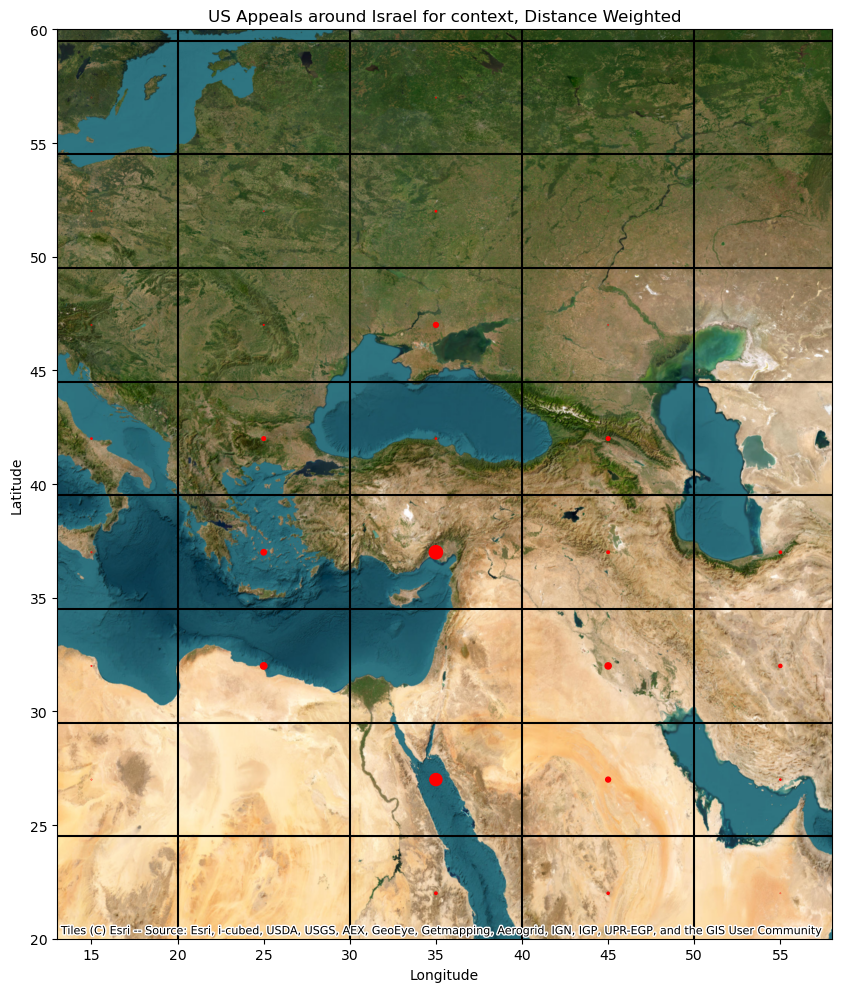

In [249]:
fig, ax = plt.subplots(figsize=(10, 12))
# ax.quiver(xx, yy, gx[:, :, 0, 0, 0], gy[:, :, 0, 0, 0], angles="xy")
ax.scatter(xx, yy, s=np.exp(-dist_no_isr.reshape(xx.shape) / 3e5) * griddata[:, :, 0, 0, 0] * 10, color="red")
grid.plot(ax=ax, color="black", label="Spatial Regions")
plt.xlim(13, 58)
plt.ylim(20, 60)
cx.add_basemap(ax, source=cx.providers.Esri.WorldImagery, crs=wgs84, zoom=6)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("US Appeals around Israel for context, Distance Weighted")

We could for example overlay that rose diagram on top of Israel in this diagram, and maybe do the same for Ukraine, e.g. like this:

Text(0.5, 1.0, 'US Appeals around Israel, Distance Weighted')

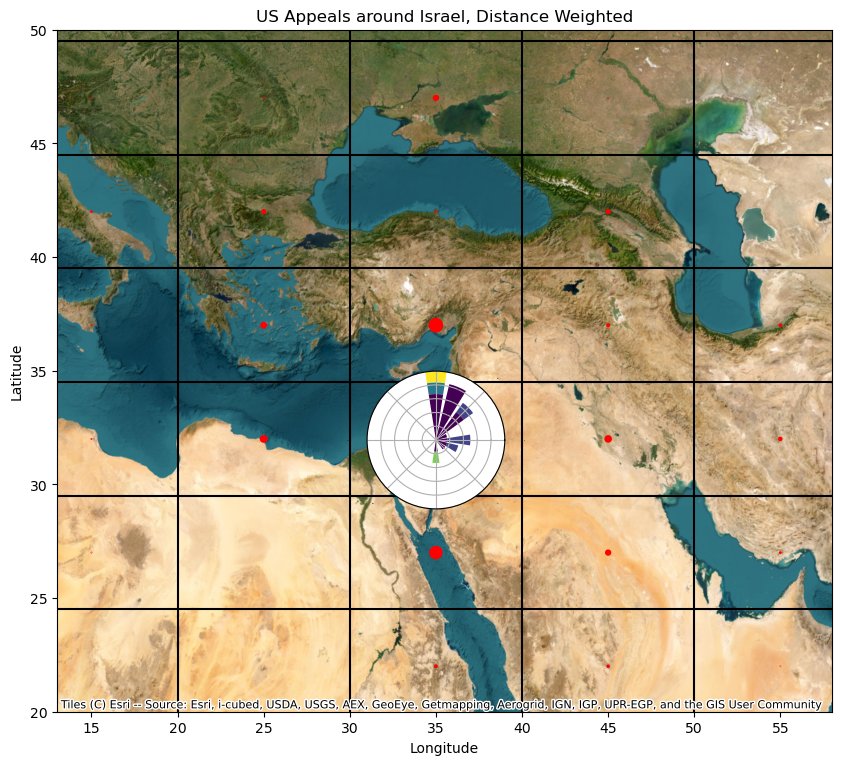

In [342]:
fig = plt.figure(figsize=(10, 12))
# ax.quiver(xx, yy, gx[:, :, 0, 0, 0], gy[:, :, 0, 0, 0], angles="xy")

ax = fig.add_subplot(111)
ax.scatter(xx, yy, s=np.exp(-dist_no_isr.reshape(xx.shape) / 3e5) * griddata[:, :, 0, 0, 0] * 10, color="red")
ax.set_xlim(13, 58)
ax.set_ylim(20, 50)
fig.canvas.draw()
isr_bl = fig.transFigure.inverted().transform(ax.transData.transform((isr_xval - 4, isr_yval - 1.5)))
isr_tr = fig.transFigure.inverted().transform(ax.transData.transform((isr_xval + 4, isr_yval + 3)))

wrax = rose.WindroseAxes(fig, [isr_bl[0], isr_bl[1], isr_tr[0] - isr_bl[0], isr_tr[1] - isr_bl[1]])
wrax.bar(az2, np.exp(-dist_no_isr / 5e5) * griddata[:, :, 0, 0, 0].flatten(), normed=True)

for label in it.chain(wrax.get_xticklabels()):
    # Uncomment for better font visibility on rose labels if wanted
    # label.set_color("black")
    # label.set_fontweight(400)
    label.set_fontsize(0)
    # label.set_backgroundcolor("white")
for label in wrax.get_yticklabels():
    label.set_fontsize(0)

fig.add_axes(wrax)


grid.plot(ax=ax, color="black", label="Spatial Regions")
cx.add_basemap(ax, source=cx.providers.Esri.WorldImagery, crs=wgs84, zoom=6)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_title("US Appeals around Israel, Distance Weighted")